In [ ]:
import os
from google.colab import drive
import librosa
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
import pandas as pd
drive.mount('/content/drive')

Mounted at /content/drive


#**DATA VISUALIZATION**


In [ ]:
def spectrogram(aud, sr, emotion):
    plt.figure(figsize=(14, 4))
    D = librosa.amplitude_to_db(np.abs(librosa.stft(aud)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.title(emotion + ' -- Spectrogram')
    plt.colorbar(format='%+2.0f dB')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.show()

def waveform(aud, sr, emotion):
    plt.figure(figsize=(14, 2))
    plt.plot(aud)
    plt.title(emotion + ' -- Waveform')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.show()

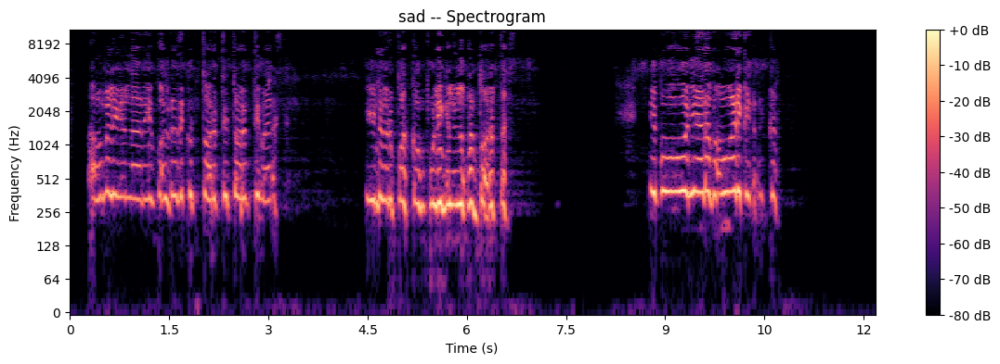

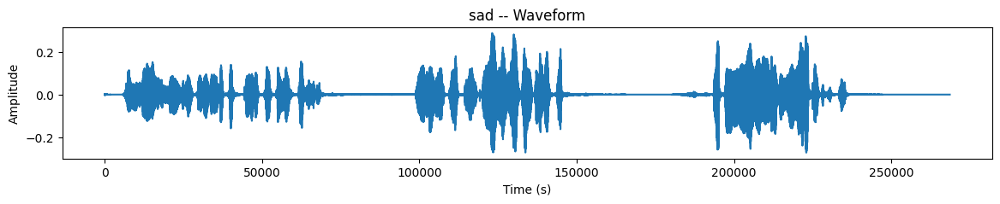

In [ ]:
path = '/content/drive/MyDrive/final_data/sad/audio_10.wav'
aud, sr = librosa.load(path, sr=22050)
spectrogram(aud, sr, 'sad')
waveform(aud, sr, 'sad')
display(Audio(data=aud, rate=sr))

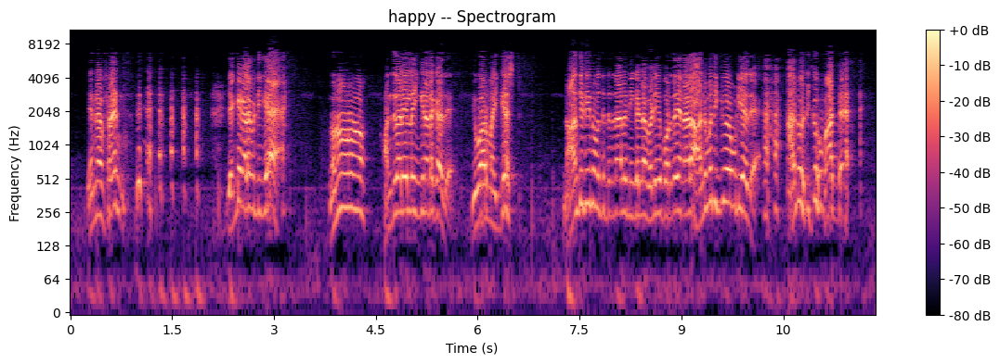

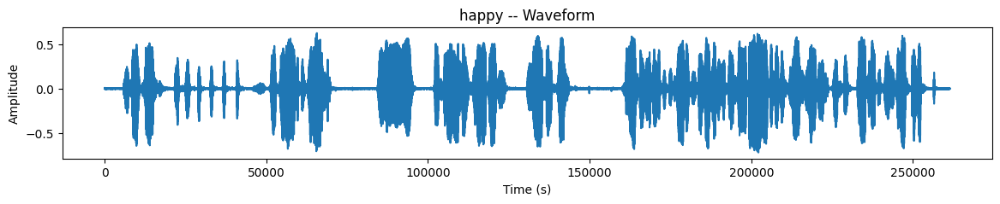

In [ ]:
path='/content/drive/MyDrive/final_data/happy/audio_20.wav'
aud, sr = librosa.load(path, sr=22050)
spectrogram(aud, sr, 'happy')
waveform(aud, sr, 'happy')
display(Audio(data=aud, rate=sr))

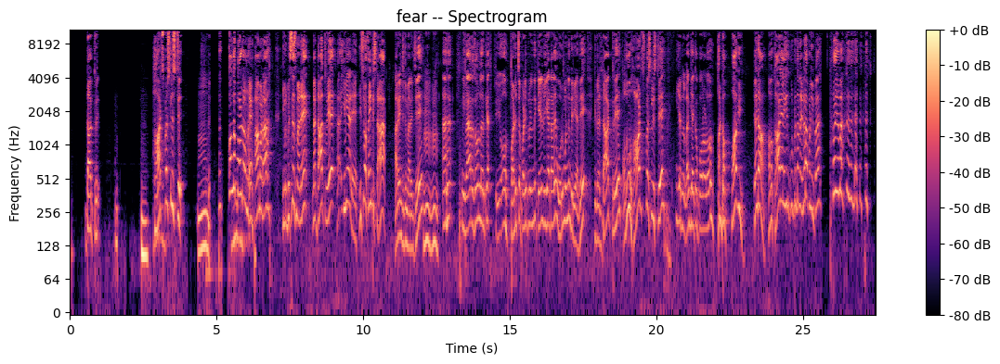

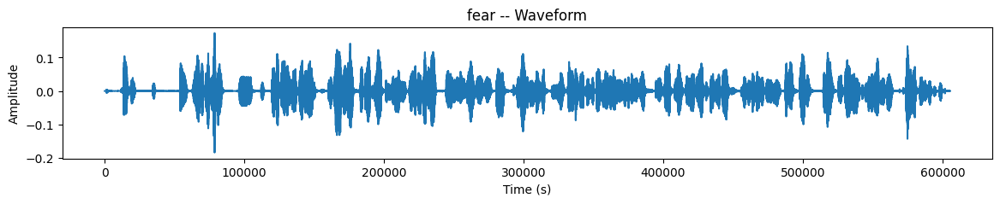

In [ ]:
path='/content/drive/MyDrive/final_data/fear/audio_2.wav'
aud, sr = librosa.load(path, sr=22050)
spectrogram(aud, sr, 'fear')
waveform(aud, sr, 'fear')
display(Audio(data=aud, rate=sr))

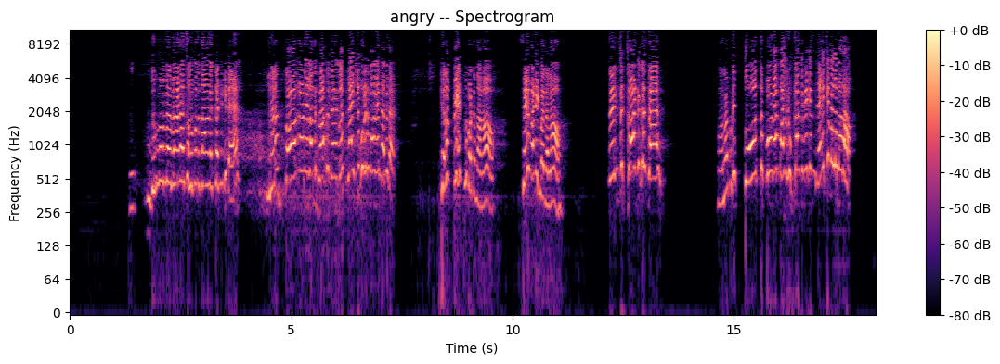

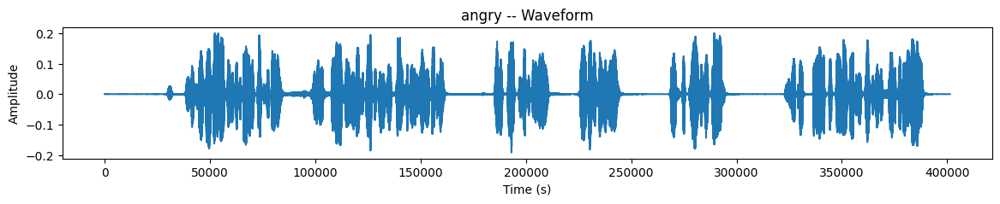

In [ ]:
path='/content/drive/MyDrive/final_data/angry/audio_15.wav'
aud, sr = librosa.load(path, sr=22050)
spectrogram(aud, sr, 'angry')
waveform(aud, sr, 'angry')
display(Audio(data=aud, rate=sr))

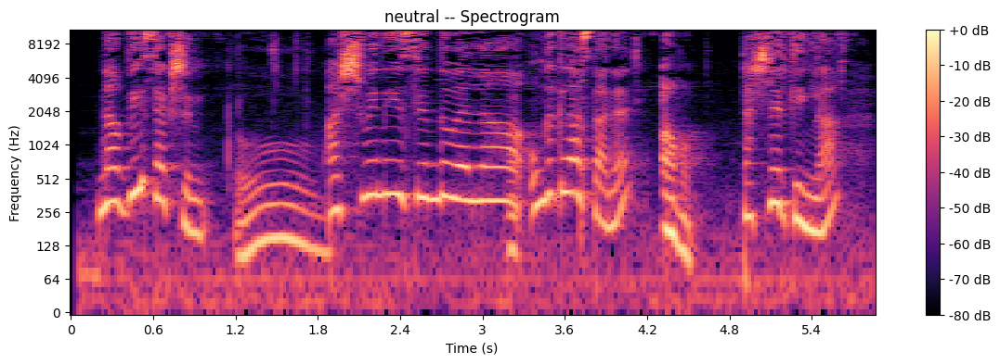

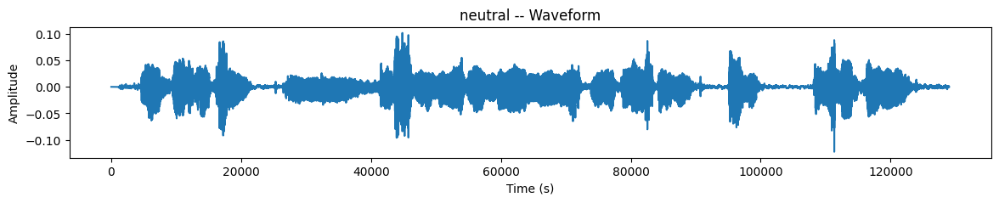

In [ ]:
path='/content/drive/MyDrive/final_data/neutral/audio_1.wav'
aud, sr = librosa.load(path, sr=22050)
spectrogram(aud, sr, 'neutral')
waveform(aud, sr, 'neutral')
display(Audio(data=aud, rate=sr))

#**DATA AUGMENTATION**

In [ ]:
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data,rate=rate)

def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sr = sampling_rate, n_steps=pitch_factor)

In [ ]:
path='/content/drive/MyDrive/final_data/sad/audio_22.wav'
data, sample_rate = librosa.load(path)

**ORIGINAL**

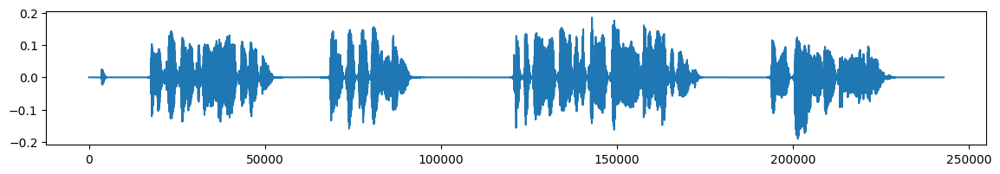

In [ ]:
plt.figure(figsize=(14,2))
plt.plot(data)
Audio(data, rate=sample_rate)

**NOISY**

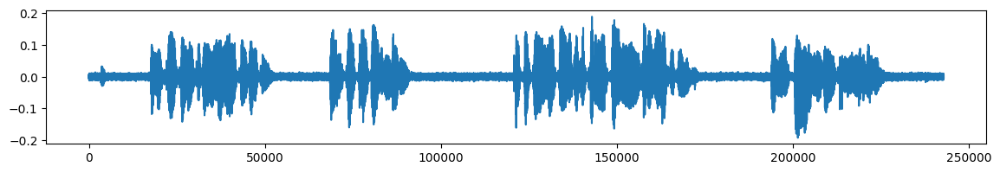

In [ ]:
x = noise(data)
plt.figure(figsize=(14,2))
plt.plot(x)
Audio(x, rate=sample_rate)

**STRETCHED**

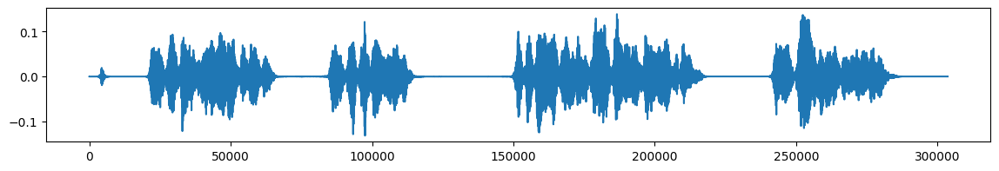

In [ ]:
x = stretch(data)
plt.figure(figsize=(14,2))
plt.plot(x)
Audio(x, rate=sample_rate)

**SHIFTING**

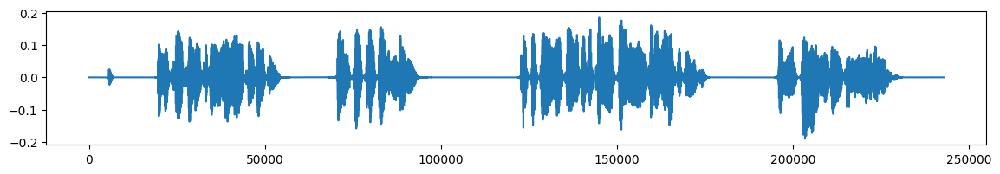

In [ ]:
x = shift(data)
plt.figure(figsize=(14,2))
plt.plot(x)
Audio(x, rate=sample_rate)

#**FEATURE EXTRACTION**

In [ ]:
def extract_features(file_path, sr=22050, n_mfcc=13):
    audio, _ = librosa.load(file_path, sr=sr)
    mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=n_mfcc)
    mfccs_mean = np.mean(mfccs, axis=1)
    return mfccs_mean

In [ ]:
data_directory = '/content/drive/My Drive/final_data/'

In [ ]:
augmented_features = []
augmented_labels = []
data_aug = [noise,stretch,shift,pitch]
for folder_name in os.listdir(data_directory):
    folder_path = os.path.join(data_directory, folder_name)
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)
        if os.path.isfile(file_path) and file_name.endswith('.wav'):
            original_features = extract_features(file_path)
            augmented_features.append(original_features)
            augmented_labels.append(folder_name)

            audio, sr = librosa.load(file_path, sr=22050)
            for i in data_aug:
              x=None
              if i==pitch :
                x=i(audio,sr,0.7)
              else:
                x=i(audio)
              augmented_features.append(np.mean(librosa.feature.mfcc(y=x, sr=sr, n_mfcc=13), axis=1))
              augmented_labels.append(folder_name)
            augmented_features.append(np.mean(librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13), axis=1))
            augmented_labels.append(folder_name)

In [ ]:
data = {'features': augmented_features, 'label': augmented_labels}
df = pd.DataFrame(data).sample(frac=1).reset_index(drop=True)

print(df.head())

                                            features  label
0  [-229.86482, 103.78791, -94.68617, 26.171827, ...  happy
1  [-332.73325, 59.463726, 9.187061, 11.079143, 6...    sad
2  [-169.45091009399604, 23.792220671860793, 17.5...    sad
3  [-152.27834, 115.07595, -5.0961704, 37.78169, ...  happy
4  [-268.9082, 65.84762, -24.130869, 5.241962, -9...  angry


In [ ]:
df['label'].unique()

array(['happy', 'sad', 'angry', 'neutral', 'fear'], dtype=object)

In [ ]:
d=dict.fromkeys(df.label.unique().tolist(),0)
for i in df.label:
  d[i]+=1

d

{'happy': 246, 'sad': 294, 'angry': 294, 'neutral': 168, 'fear': 168}

#**LSTM**

In [ ]:
x = [i for i in df['features']]
x = np.array(x)
x = np.expand_dims(x,-1)

In [ ]:
en = LabelEncoder()
y = en.fit_transform(df[['label']])

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense,LSTM,Dropout

lstm= Sequential([
    LSTM(256, return_sequences=False ,input_shape =(13,1)),
    Dense(128,activation='relu'),
    Dropout(0,2),
    Dense(64,activation='relu'),
    Dropout(0.2),
    Dense(5,activation='softmax'),
])
lstm.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
lstm.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 256)               264192    
                                                                 
 dense (Dense)               (None, 128)               32896     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 5)                 325       
                                                                 
Total params: 305669 (1.17 MB)
Trainable params: 305669 

In [ ]:
lstm_ = lstm.fit(X_train,y_train,validation_split=0.3,epochs=20,batch_size=4)

Epoch 1/20
144/144 [==============================] - 8s 32ms/step - loss: 1.4327 - accuracy: 0.3822 - val_loss: 1.3115 - val_accuracy: 0.4675
Epoch 2/20
144/144 [==============================] - 5s 32ms/step - loss: 1.3273 - accuracy: 0.4660 - val_loss: 1.2696 - val_accuracy: 0.4756
Epoch 3/20
144/144 [==============================] - 5s 35ms/step - loss: 1.2263 - accuracy: 0.5271 - val_loss: 1.2097 - val_accuracy: 0.4919
Epoch 4/20
144/144 [==============================] - 5s 33ms/step - loss: 1.1737 - accuracy: 0.5253 - val_loss: 1.2335 - val_accuracy: 0.5325
Epoch 5/20
144/144 [==============================] - 4s 29ms/step - loss: 1.1269 - accuracy: 0.5323 - val_loss: 1.2553 - val_accuracy: 0.4797
Epoch 6/20
144/144 [==============================] - 5s 36ms/step - loss: 0.9911 - accuracy: 0.6056 - val_loss: 1.0396 - val_accuracy: 0.6260
Epoch 7/20
144/144 [==============================] - 4s 25ms/step - loss: 0.9571 - accuracy: 0.6248 - val_loss: 1.0309 - val_accuracy: 0.5772

#**Bidirectional LSTM***

In [ ]:
enc=OneHotEncoder()
blstm_y=enc.fit_transform(df[['label']]).toarray()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, blstm_y, test_size=0.33, random_state=42)

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Bidirectional, Dense

bdlstm = Sequential()
bdlstm.add(Bidirectional(LSTM(units=128, return_sequences=True), input_shape=(13,1)))
bdlstm.add(Dropout(0.2))
bdlstm.add(Bidirectional(LSTM(units=64)))
bdlstm.add(Dense(units=5, activation='softmax'))

# Compile the model
bdlstm.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
bdlstm_=bdlstm.fit(X_train, y_train, epochs=20, batch_size=4, validation_data=(X_test, y_test))

Epoch 1/20
196/196 [==============================] - 16s 41ms/step - loss: 1.3267 - accuracy: 0.4789 - val_loss: 1.1465 - val_accuracy: 0.5659
Epoch 2/20
196/196 [==============================] - 9s 48ms/step - loss: 1.1057 - accuracy: 0.5466 - val_loss: 1.0556 - val_accuracy: 0.5891
Epoch 3/20
196/196 [==============================] - 11s 56ms/step - loss: 0.9627 - accuracy: 0.6220 - val_loss: 1.0114 - val_accuracy: 0.6047
Epoch 4/20
196/196 [==============================] - 8s 39ms/step - loss: 0.8541 - accuracy: 0.6705 - val_loss: 0.8628 - val_accuracy: 0.6615
Epoch 5/20
196/196 [==============================] - 5s 27ms/step - loss: 0.6979 - accuracy: 0.7395 - val_loss: 0.7417 - val_accuracy: 0.7313
Epoch 6/20
196/196 [==============================] - 7s 37ms/step - loss: 0.5725 - accuracy: 0.7688 - val_loss: 0.6208 - val_accuracy: 0.7778
Epoch 7/20
196/196 [==============================] - 5s 27ms/step - loss: 0.5135 - accuracy: 0.8059 - val_loss: 0.5352 - val_accuracy: 0.82

#**CNN**

In [ ]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense

cnn = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(13, 1)),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=64, kernel_size=3, activation='relu'),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(5, activation='softmax')
])


# Compile the model
cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 11, 64)            256       
                                                                 
 max_pooling1d (MaxPooling1  (None, 5, 64)             0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 3, 64)             12352     
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 1, 64)             0         
 g1D)                                                            
                                                                 
 flatten (Flatten)           (None, 64)                0         
                                                                 
 dense_4 (Dense)             (None, 64)               

In [ ]:
cnn_=cnn.fit(X_train, y_train, epochs=20, batch_size=4, validation_data=(X_test, y_test))

Epoch 1/20
196/196 [==============================] - 2s 4ms/step - loss: 1.6324 - accuracy: 0.4738 - val_loss: 1.4477 - val_accuracy: 0.4444
Epoch 2/20
196/196 [==============================] - 1s 3ms/step - loss: 1.2137 - accuracy: 0.5862 - val_loss: 0.8441 - val_accuracy: 0.6770
Epoch 3/20
196/196 [==============================] - 1s 3ms/step - loss: 0.9609 - accuracy: 0.6347 - val_loss: 0.8046 - val_accuracy: 0.7003
Epoch 4/20
196/196 [==============================] - 1s 3ms/step - loss: 0.7971 - accuracy: 0.7101 - val_loss: 0.9412 - val_accuracy: 0.6176
Epoch 5/20
196/196 [==============================] - 1s 3ms/step - loss: 0.6850 - accuracy: 0.7420 - val_loss: 0.8805 - val_accuracy: 0.6537
Epoch 6/20
196/196 [==============================] - 1s 3ms/step - loss: 0.6257 - accuracy: 0.7535 - val_loss: 0.8291 - val_accuracy: 0.6537
Epoch 7/20
196/196 [==============================] - 1s 3ms/step - loss: 0.5763 - accuracy: 0.7829 - val_loss: 0.7130 - val_accuracy: 0.7416
Epoch 

#**COMPARISION OF MODELS**


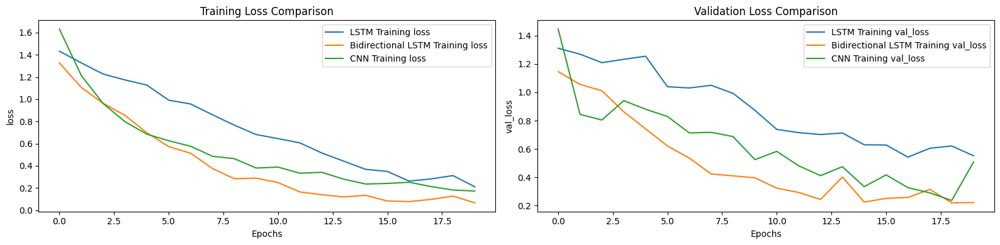

In [ ]:
def plot_metrics(metric, title):
    plt.plot(lstm_.history[metric], label='LSTM Training ' + metric)
    plt.plot(bdlstm_.history[metric], label='Bidirectional LSTM Training ' + metric)
    plt.plot(cnn_.history[metric], label='CNN Training ' + metric)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel(metric)
    plt.legend()

fig, axs = plt.subplots(1, 2, figsize=(16,4))
plt.subplot(1, 2, 1)
plot_metrics('loss', 'Training Loss Comparison')
plt.subplot(1, 2, 2)
plot_metrics('val_loss', 'Validation Loss Comparison')
plt.tight_layout()
plt.show()

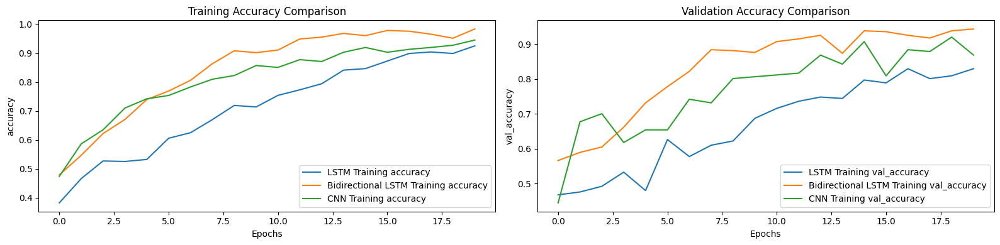

In [ ]:
def plot_accuracy(metric, title):
    plt.plot(lstm_.history[metric], label='LSTM Training ' + metric)
    plt.plot(bdlstm_.history[metric], label='Bidirectional LSTM Training ' + metric)
    plt.plot(cnn_.history[metric], label='CNN Training ' + metric)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel(metric)
    plt.legend()

fig, axs = plt.subplots(1, 2, figsize=(16, 4))
plt.subplot(1, 2, 1)
plot_accuracy('accuracy', 'Training Accuracy Comparison')
plt.subplot(1, 2, 2)
plot_accuracy('val_accuracy', 'Validation Accuracy Comparison')
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import classification_report

class_names = ['sad', 'happy', 'angry', 'neutral', 'fear']

lstm_preds = lstm.predict(X_test)
bdlstm_preds = bdlstm.predict(X_test)
cnn_preds = cnn.predict(X_test)

y_true = np.argmax(y_test, axis=1)

lstm_report = classification_report(y_true, lstm_preds.argmax(axis=1), target_names=class_names)
bdlstm_report = classification_report(y_true, bdlstm_preds.argmax(axis=1), target_names=class_names)
cnn_report = classification_report(y_true, cnn_preds.argmax(axis=1), target_names=class_names)

print("\n\t\t\tLSTM Classification Report:")
print(lstm_report)

print("\n\t\t\tBidirectional LSTM Classification Report:")
print(bdlstm_report)

print("\n\t\t\tCNN Classification Report:")
print(cnn_report)


13/13 [==============================] - 0s 2ms/step

			LSTM Classification Report:
              precision    recall  f1-score   support

         sad       0.88      0.91      0.89        96
       happy       0.93      0.79      0.85        47
       angry       0.91      0.90      0.91        82
     neutral       0.87      0.95      0.91        61
        fear       0.95      0.94      0.95       101

    accuracy                           0.91       387
   macro avg       0.91      0.90      0.90       387
weighted avg       0.91      0.91      0.91       387


			Bidirectional LSTM Classification Report:
              precision    recall  f1-score   support

         sad       0.88      0.96      0.92        96
       happy       1.00      0.94      0.97        47
       angry       0.97      0.90      0.94        82
     neutral       0.91      0.95      0.93        61
        fear       0.98      0.96      0.97       101

    accuracy                           0.94       387


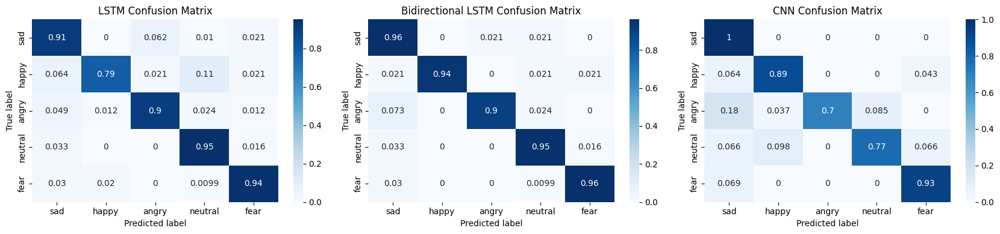

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


def plot_confusion_matrix(ax, y_true, y_pred, class_names, title):
    cm = confusion_matrix(y_true, y_pred)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    sns.heatmap(cm_normalized, annot=True, cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Predicted label')
    ax.set_ylabel('True label')

fig, axs = plt.subplots(1, 3, figsize=(17, 4))

plot_confusion_matrix(axs[0], y_true, lstm_preds.argmax(axis=1), class_names, 'LSTM Confusion Matrix')
plot_confusion_matrix(axs[1], y_true, bdlstm_preds.argmax(axis=1), class_names, 'Bidirectional LSTM Confusion Matrix')
plot_confusion_matrix(axs[2], y_true, cnn_preds.argmax(axis=1), class_names, 'CNN Confusion Matrix')

plt.tight_layout()
plt.show()


#**DEMO DEPLOY**

In [ ]:
!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 42.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.5/315.5 kB 29.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.5/142.5 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 47.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 8.0 MB/s e

In [ ]:
import gradio as gr
def predict_emotion(audio_file):

    mfcc = extract_features(audio_file)
    mfcc = np.expand_dims(mfcc, axis=0)
    mfcc = np.expand_dims(mfcc, axis=-1)

    prediction = bdlstm.predict(mfcc)
    labels = ['angry','sad','neutral','fear','happy']
    emotion = labels[np.argmax(prediction)]
    return emotion

In [ ]:
iface = gr.Interface(
    fn=predict_emotion,
    inputs=[gr.Audio(type="filepath", label="Upload Audio")],
    outputs=[gr.Textbox(label="Generated Text")],
    live=True)


iface.launch()

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://9e57cbf38afaabbe66.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
